# Set Up: Importing packages and libraries

In [1]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

try:
    # %tensorflow_version only exists in Colab.
    %tensorflow_version 2.x
except Exception:
    pass

# TensorFlow ≥2.0 is required
import tensorflow as tf
assert tf.__version__ >= "2.0"
from tensorflow import keras

# Common imports
import numpy as np
import pandas as pd 
from pandas import Series, DataFrame
from keras import models
from keras import layers
from keras import optimizers
from keras.utils import to_categorical
import os
import torch

# to make this notebook's output stable across runs
np.random.seed(42)

import time

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

from IPython.display import clear_output

# Ignore useless warnings (see SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")
import logging

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # FATAL
logging.getLogger('tensorflow').setLevel(logging.FATAL)

!pip install Pillow
from PIL import Image
import imageio

# GPU memory footprint support libraries/code
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU

clear_output()


# Uploading the dataset as CSV files

All dataset files are first uploaded in the project's GitHub repository and are read using pandas data frame here.

In [2]:
all_dfs = []
n = 16 
for i in range(1, n):
    url = 'https://raw.githubusercontent.com/OyuntugsGantumur/cs414.project.github.io/main/data_files/dataset_' + str(i) + '.csv'
    print(url)
    new_df = pd.read_csv(url)
    all_dfs.append(new_df)

df = pd.concat(all_dfs, ignore_index=True)
print(df.shape)
df

https://raw.githubusercontent.com/OyuntugsGantumur/cs414.project.github.io/main/data_files/dataset_1.csv
https://raw.githubusercontent.com/OyuntugsGantumur/cs414.project.github.io/main/data_files/dataset_2.csv
https://raw.githubusercontent.com/OyuntugsGantumur/cs414.project.github.io/main/data_files/dataset_3.csv
https://raw.githubusercontent.com/OyuntugsGantumur/cs414.project.github.io/main/data_files/dataset_4.csv
https://raw.githubusercontent.com/OyuntugsGantumur/cs414.project.github.io/main/data_files/dataset_5.csv
https://raw.githubusercontent.com/OyuntugsGantumur/cs414.project.github.io/main/data_files/dataset_6.csv
https://raw.githubusercontent.com/OyuntugsGantumur/cs414.project.github.io/main/data_files/dataset_7.csv
https://raw.githubusercontent.com/OyuntugsGantumur/cs414.project.github.io/main/data_files/dataset_8.csv
https://raw.githubusercontent.com/OyuntugsGantumur/cs414.project.github.io/main/data_files/dataset_9.csv
https://raw.githubusercontent.com/OyuntugsGantumur/cs41

,emotion,Usage,pixels
0,0,Training,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...
1,0,Training,151 150 147 155 148 133 111 140 170 174 182 15...
2,2,Training,231 212 156 164 174 138 161 173 182 200 106 38...
3,4,Training,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...
4,6,Training,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...
...,...,...,...
35882,6,PrivateTest,50 36 17 22 23 29 33 39 34 37 37 37 39 43 48 5...
35883,3,PrivateTest,178 174 172 173 181 188 191 194 196 199 200 20...
35884,0,PrivateTest,17 17 16 23 28 22 19 17 25 26 20 24 31 19 27 9...
35885,3,PrivateTest,30 28 28 29 31 30 42 68 79 81 77 67 67 71 63 6...


In [3]:
print(len(df[0:]['emotion']))
print(df[1:][' pixels'])

35887
1        151 150 147 155 148 133 111 140 170 174 182 15...
2        231 212 156 164 174 138 161 173 182 200 106 38...
3        24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...
4        4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...
5        55 55 55 55 55 54 60 68 54 85 151 163 170 179 ...
                               ...                        
35882    50 36 17 22 23 29 33 39 34 37 37 37 39 43 48 5...
35883    178 174 172 173 181 188 191 194 196 199 200 20...
35884    17 17 16 23 28 22 19 17 25 26 20 24 31 19 27 9...
35885    30 28 28 29 31 30 42 68 79 81 77 67 67 71 63 6...
35886    19 13 14 12 13 16 21 33 50 57 71 84 97 108 122...
Name:  pixels, Length: 35886, dtype: object


#Splitting and Scaling the dataset

As mentioned before, the dataset was in a csv file and all pixel information was stored as a long string. Here, we are splitting the string of pixels and storing the information as an array for each sample.

In [4]:
input_length = len(df[0:][' pixels'])
X_train = np.empty(shape=(input_length, 48, 48))
for n in range(input_length):
    pixel_str = df[0:][' pixels'][n]
    pixel_arr = pixel_str.split(' ')
    pixel_num = [int(i) for i in pixel_arr]
    temp = np.array(list(pixel_num)).reshape(48, 48)
    X_train[n] = temp

X_train = (255 - X_train)/255.  #Had to invert the pixels here
y_train = df[0:]['emotion']
print(y_train.shape)

class_names = ['Anger', 'Disgust', 'Fear', 'Happy', 'Sadness', 'Surprised', 'Neutral']

(35887,)


Sample of images in the dataset:

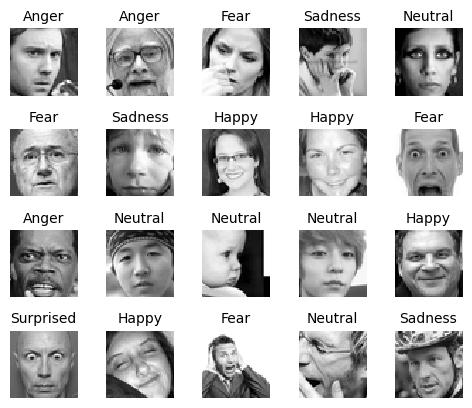

In [5]:
n_rows = 4
n_cols = 5
plt.figure(figsize=(n_cols * 1.2, n_rows * 1.2))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(X_train[index], cmap="binary", interpolation="nearest")
        plt.axis('off')
        plt.title(class_names[y_train[index]], fontsize=10)
plt.subplots_adjust(wspace=0.2, hspace=0.5)
plt.show()

In [6]:
training = df.loc[df[" Usage"] == "Training"]
public_test = df.loc[df[" Usage"] == "PublicTest"]
private_test = df.loc[df[" Usage"] == "PrivateTest"]

train_labels = training["emotion"]
train_labels = to_categorical(train_labels)

train_pixels = training[" pixels"].str.split(" ").tolist()
train_pixels = np.uint8(train_pixels)
train_pixels = train_pixels.reshape((28709, 48, 48, 1))
train_pixels = train_pixels.astype("float32") / 255


private_labels = private_test["emotion"]
private_labels = to_categorical(private_labels)

private_pixels = private_test[" pixels"].str.split(" ").tolist()
private_pixels = np.uint8(private_pixels)
private_pixels = private_pixels.reshape((3589, 48, 48, 1))
private_pixels = private_pixels.astype("float32") / 255


public_labels = public_test["emotion"]
public_labels = to_categorical(public_labels)

public_pixels = public_test[" pixels"].str.split(" ").tolist()
public_pixels = np.uint8(public_pixels)
public_pixels = public_pixels.reshape((3589, 48, 48, 1))
public_pixels = public_pixels.astype("float32") / 255

# Model Design

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

model_1 = models.Sequential()

model_1.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(48,48,1)))
model_1.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
model_1.add(layers.BatchNormalization())
model_1.add(layers.MaxPooling2D(pool_size=(2,2), strides=(2, 2)))
model_1.add(layers.Dropout(0.3))

model_1.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
model_1.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
model_1.add(layers.BatchNormalization())
model_1.add(layers.MaxPooling2D(pool_size=(2,2), strides=(2, 2)))
model_1.add(layers.Dropout(0.3))

model_1.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
model_1.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
model_1.add(layers.BatchNormalization())
model_1.add(layers.MaxPooling2D(pool_size=(2,2), strides=(2, 2)))
model_1.add(layers.Dropout(0.3))

model_1.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
model_1.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
model_1.add(layers.BatchNormalization())
model_1.add(layers.MaxPooling2D(pool_size=(2,2), strides=(2, 2)))
model_1.add(layers.Dropout(0.3))

model_1.add(layers.Conv2D(1024, (3, 3), activation='relu', padding='same'))
model_1.add(layers.Conv2D(1024, (3, 3), activation='relu', padding='same'))
model_1.add(layers.BatchNormalization())
model_1.add(layers.MaxPooling2D(pool_size=(2,2), strides=(2, 2)))
model_1.add(layers.Dropout(0.3))


model_1.add(layers.Flatten())
model_1.add(layers.Dense(1024, activation='relu'))
model_1.add(layers.Dropout(0.3))
model_1.add(layers.Dense(512, activation='relu'))
model_1.add(layers.Dropout(0.3))
model_1.add(layers.Dense(256, activation='relu'))
model_1.add(layers.Dropout(0.3))
model_1.add(layers.Dense(128, activation='relu'))
model_1.add(layers.Dropout(0.3))
model_1.add(layers.Dense(7, activation='softmax'))

model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 46, 46, 64)        640       
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 46, 64)        36928     
                                                                 
 batch_normalization (BatchN  (None, 46, 46, 64)       256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 23, 23, 64)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 23, 23, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 23, 23, 128)       7

# Running the model

Epoch 1/30
113/113 [==============================] - 50s 228ms/step - loss: 1.9063 - accuracy: 0.2156 - val_loss: 1.8434 - val_accuracy: 0.2449
Epoch 2/30
113/113 [==============================] - 24s 208ms/step - loss: 1.8175 - accuracy: 0.2369 - val_loss: 1.8216 - val_accuracy: 0.2449
Epoch 3/30
113/113 [==============================] - 24s 210ms/step - loss: 1.8012 - accuracy: 0.2489 - val_loss: 1.8410 - val_accuracy: 0.2469
Epoch 4/30
113/113 [==============================] - 24s 212ms/step - loss: 1.7717 - accuracy: 0.2672 - val_loss: 1.8829 - val_accuracy: 0.2449
Epoch 5/30
113/113 [==============================] - 24s 213ms/step - loss: 1.6903 - accuracy: 0.3146 - val_loss: 1.8500 - val_accuracy: 0.2784
Epoch 6/30
113/113 [==============================] - 24s 214ms/step - loss: 1.5219 - accuracy: 0.3961 - val_loss: 1.6289 - val_accuracy: 0.3511
Epoch 7/30
113/113 [==============================] - 24s 215ms/step - loss: 1.4309 - accuracy: 0.4326 - val_loss: 1.7334 - val_ac

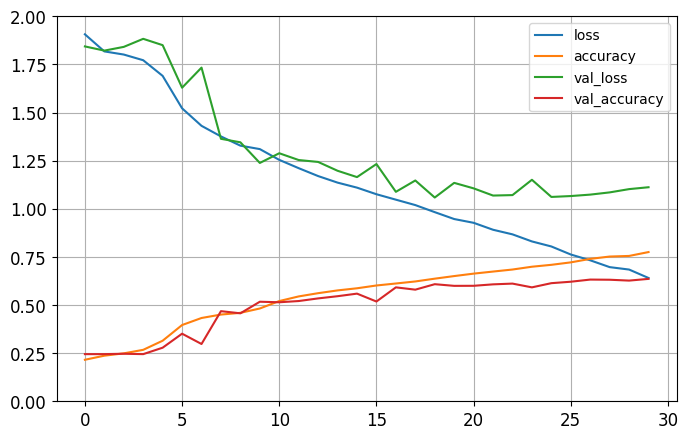

In [8]:
model_1.compile(optimizer = "Adam", loss = "categorical_crossentropy", metrics = ["accuracy"])

history_nn = model_1.fit(train_pixels, train_labels, batch_size = 256, epochs = 30,
                validation_data = (private_pixels, private_labels))

#Plotting performance
pd.DataFrame(history_nn.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 2)
plt.show()

## Testing the model

In [9]:
print("Evaluate model on test data")
results = model_1.evaluate(public_pixels, public_labels, batch_size=256)
print("test loss, test acc:", results)

Evaluate model on test data
15/15 [==============================] - 1s 52ms/step - loss: 1.1491 - accuracy: 0.6308
test loss, test acc: [1.1490931510925293, 0.6308164000511169]


# Using Model on Custom Web Images

## Loading image

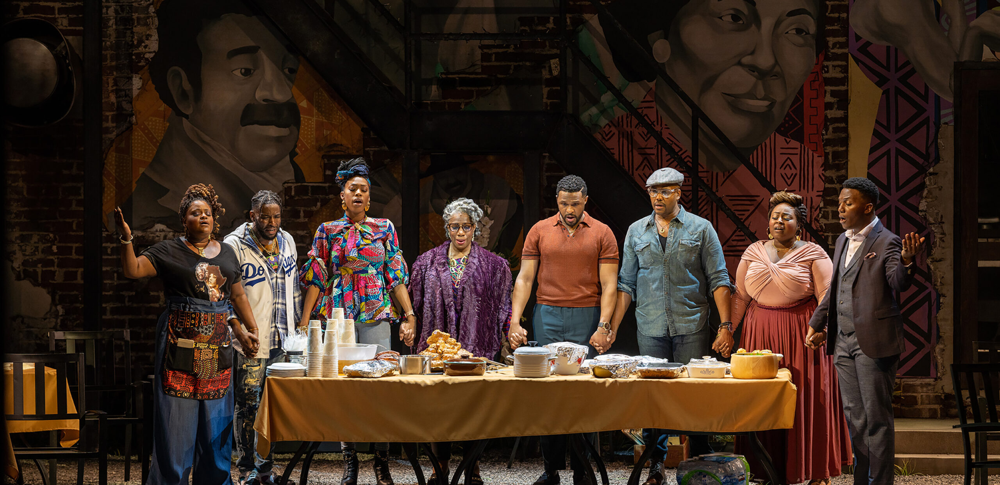

(1244, 2560, 3)


In [10]:
import urllib
from io import BytesIO
from imageio import imread
import requests

urllib.request.urlretrieve('https://github.com/OyuntugsGantumur/cs414.project.github.io/blob/main/test_images/test_0.jpg?raw=true', 
                           "test_0.jpg")
loaded_img = Image.open("test_0.jpg")

loaded_img.show()
img = np.asarray(loaded_img)
print(img.shape)

## Detecting faces in images

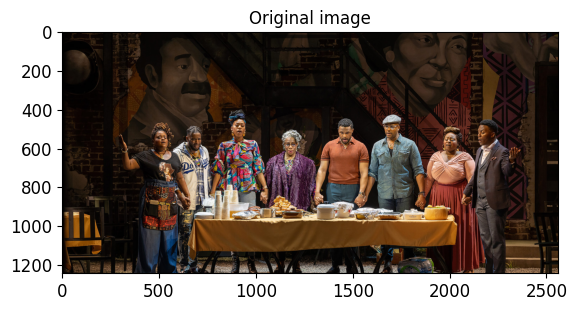

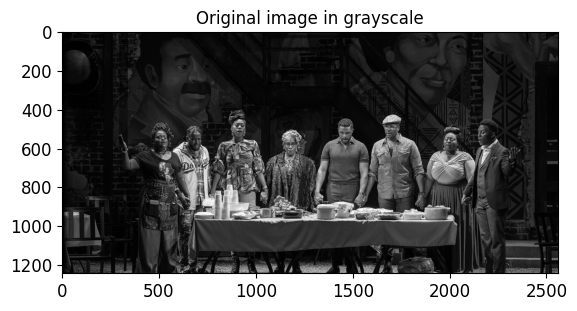

In [11]:
import cv2

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

plt.title("Original image")
plt.imshow(img)
plt.show()

plt.title("Original image in grayscale")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap = plt.cm.gray)
plt.show()


#Recognizing faces in the image
images = []
faces = face_cascade.detectMultiScale(gray, 
                                      scaleFactor=1.3,
                                      minNeighbors=3,
                                      minSize=(48, 48))

try:
    for i in range(0, len(faces)): 
        (x, y, w, h) = faces[i]
        face = cv2.resize(gray[y:y+w, x:x+h], (48, 48))
        images.append(face)
except:
    print("No faces detected")


#Converting the images to pixels
arr = np.zeros((len(images), 48, 48))
for n in range(len(images)):
    pixels = (255 - np.array(images[n])) / 255.
    arr[n] = [i for i in pixels]

## Displaying the detected faces

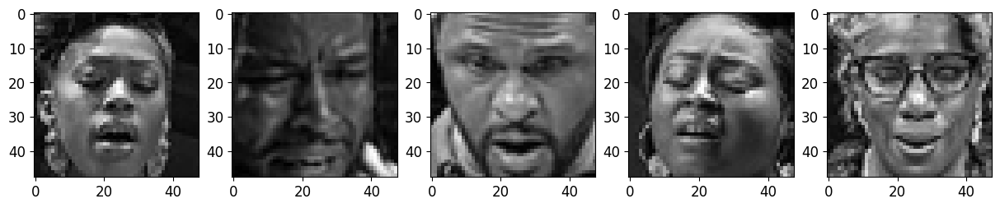

In [12]:
n_rows = 1
n_cols = 5
plt.figure(figsize=(n_cols * 3, n_rows * 3))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index + 1)

        try:
            plt.imshow(arr[index], cmap="binary", interpolation="nearest")
        except:
            print()
plt.subplots_adjust(wspace=0.2, hspace=0.5)
plt.show()

## Predicting their emotions

1/1 [==============================] - 0s 233ms/step


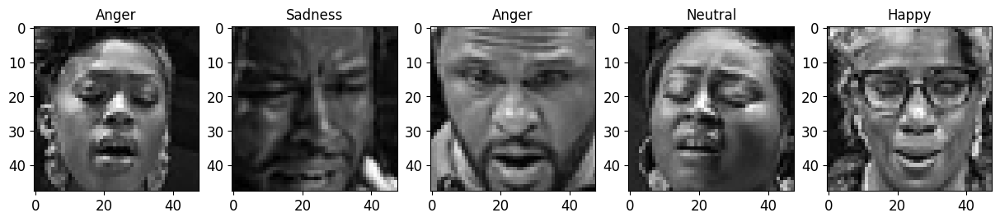

In [13]:
prediction=model_1.predict(arr)
prediction = prediction.argmax(axis=-1)

n_rows = 1
n_cols = 5
plt.figure(figsize=(n_cols * 3, n_rows * 3))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index + 1)
        try:
            plt.imshow(arr[index], cmap="binary", interpolation="nearest")
            plt.title(class_names[prediction[index]], fontsize=12)
        except:
            print()

   

plt.subplots_adjust(wspace=0.2, hspace=0.5)
plt.show()

#Running model with the rest of images

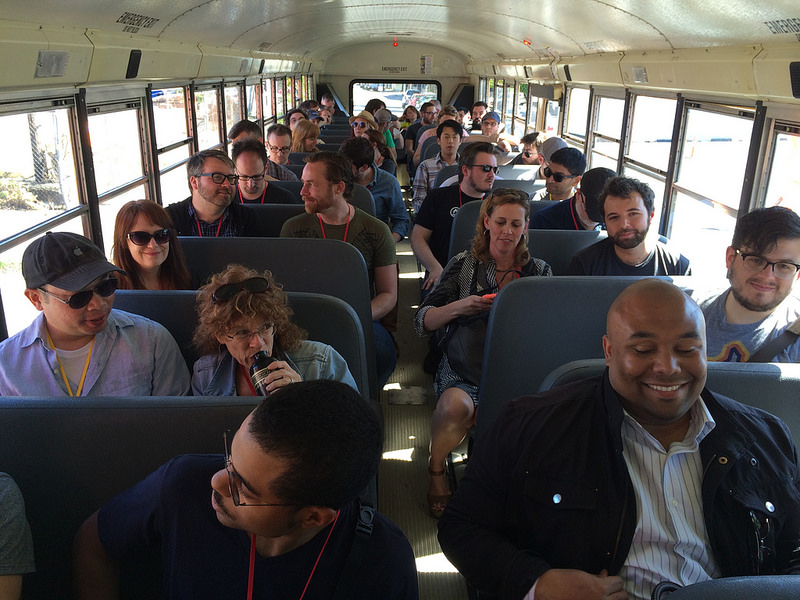

1/1 [==============================] - 0s 448ms/step



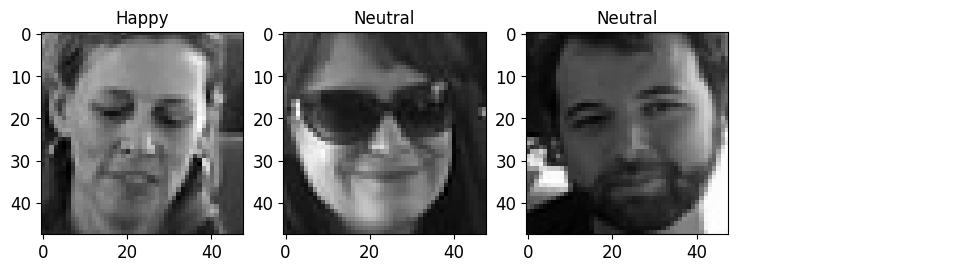

In [14]:
urllib.request.urlretrieve('https://github.com/OyuntugsGantumur/cs414.project.github.io/blob/main/test_images/test_3.png?raw=true', 
                           "test_3.png")
loaded_img = Image.open("test_3.png")

loaded_img.show()
img = np.asarray(loaded_img)

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

images = []
faces = face_cascade.detectMultiScale(gray, 
                                      scaleFactor=1.3,
                                      minNeighbors=3,
                                      minSize=(48, 48))

try:
    for i in range(0, len(faces)): 
        (x, y, w, h) = faces[i]
        face = cv2.resize(gray[y:y+w, x:x+h], (48, 48))
        images.append(face)
except:
    print("No faces detected")


#Converting the images to pixels
arr = np.zeros((len(images), 48, 48))
for n in range(len(images)):
    pixels = (255 - np.array(images[n])) / 255.
    arr[n] = [i for i in pixels]

prediction = model_1.predict(arr)
prediction = prediction.argmax(axis=-1)

n_rows = 1
n_cols = 4
plt.figure(figsize=(n_cols * 3, n_rows * 3))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index + 1)
        try:
            plt.imshow(arr[index], cmap="binary", interpolation="nearest")
            plt.title(class_names[prediction[index]], fontsize=12)
        except:
            print()

plt.axis('off')
plt.subplots_adjust(wspace=0.2, hspace=0.5)
plt.show()

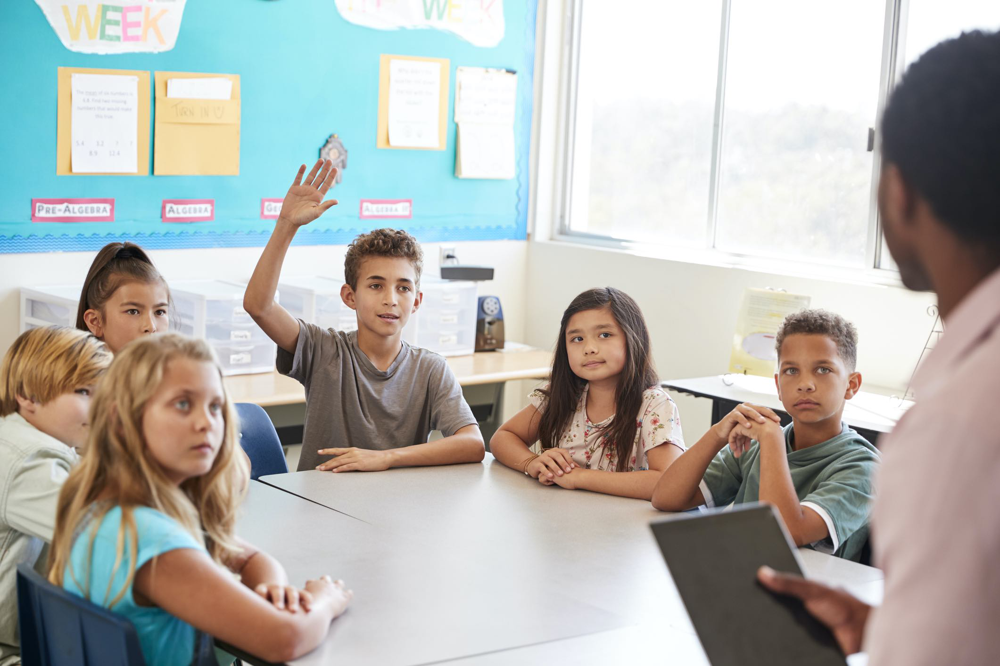

1/1 [==============================] - 0s 489ms/step



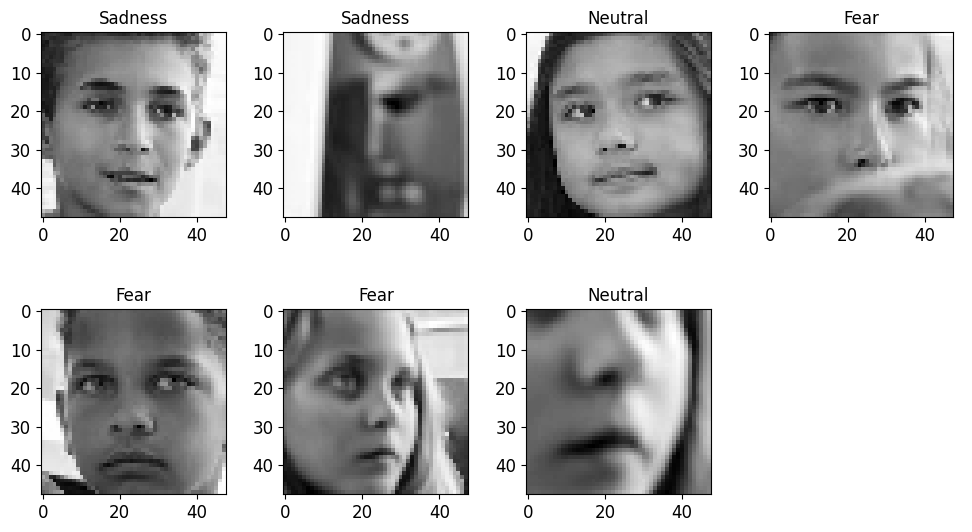

In [15]:
urllib.request.urlretrieve('https://github.com/OyuntugsGantumur/cs414.project.github.io/blob/main/test_images/test_4.png?raw=true', 
                           "test_4.png")
loaded_img = Image.open("test_4.png")

loaded_img.show()
img = np.asarray(loaded_img)

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

images = []
faces = face_cascade.detectMultiScale(gray, 
                                      scaleFactor=1.3,
                                      minNeighbors=3,
                                      minSize=(48, 48))

try:
    for i in range(0, len(faces)): 
        (x, y, w, h) = faces[i]
        face = cv2.resize(gray[y:y+w, x:x+h], (48, 48))
        images.append(face)
except:
    print("No faces detected")


#Converting the images to pixels
arr = np.zeros((len(images), 48, 48))
for n in range(len(images)):
    pixels = (255 - np.array(images[n])) / 255.
    arr[n] = [i for i in pixels]

prediction = model_1.predict(arr)
prediction = prediction.argmax(axis=-1)

n_rows = 2
n_cols = 4
plt.figure(figsize=(n_cols * 3, n_rows * 3))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index + 1)
        try:
            plt.imshow(arr[index], cmap="binary", interpolation="nearest")
            plt.title(class_names[prediction[index]], fontsize=12)
        except:
            print()

plt.axis('off')
plt.subplots_adjust(wspace=0.2, hspace=0.5)
plt.show()

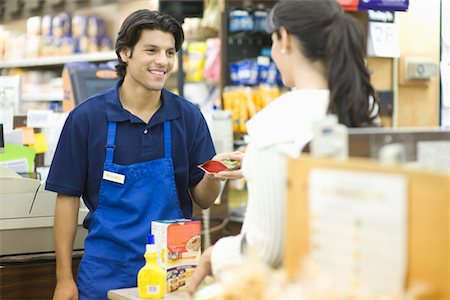

1/1 [==============================] - 0s 405ms/step



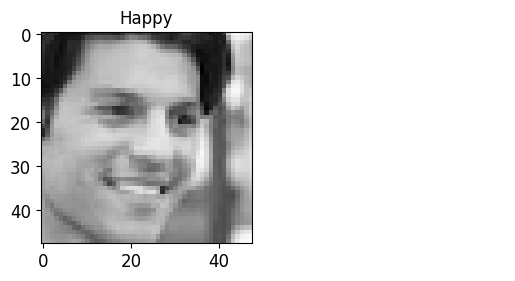

In [16]:
urllib.request.urlretrieve('https://github.com/OyuntugsGantumur/cs414.project.github.io/blob/main/test_images/test_5.png?raw=true', 
                           "test_5.png")
loaded_img = Image.open("test_5.png")

loaded_img.show()
img = np.asarray(loaded_img)

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

images = []
faces = face_cascade.detectMultiScale(gray, 
                                      scaleFactor=1.3,
                                      minNeighbors=3,
                                      minSize=(48, 48))

try:
    for i in range(0, len(faces)): 
        (x, y, w, h) = faces[i]
        face = cv2.resize(gray[y:y+w, x:x+h], (48, 48))
        images.append(face)
except:
    print("No faces detected")


#Converting the images to pixels
arr = np.zeros((len(images), 48, 48))
for n in range(len(images)):
    pixels = (255 - np.array(images[n])) / 255.
    arr[n] = [i for i in pixels]

prediction = model_1.predict(arr)
prediction = prediction.argmax(axis=-1)

n_rows = 1
n_cols = 2
plt.figure(figsize=(n_cols * 3, n_rows * 3))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index + 1)
        try:
            plt.imshow(arr[index], cmap="binary", interpolation="nearest")
            plt.title(class_names[prediction[index]], fontsize=12)
        except:
            print()


plt.axis('off')
plt.subplots_adjust(wspace=0.2, hspace=0.5)
plt.show()

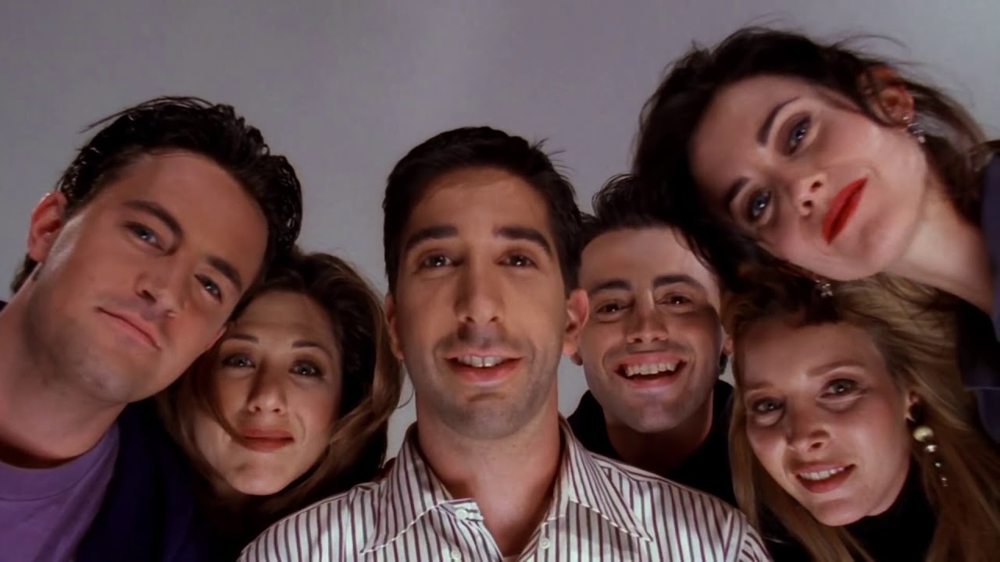

1/1 [==============================] - 0s 351ms/step



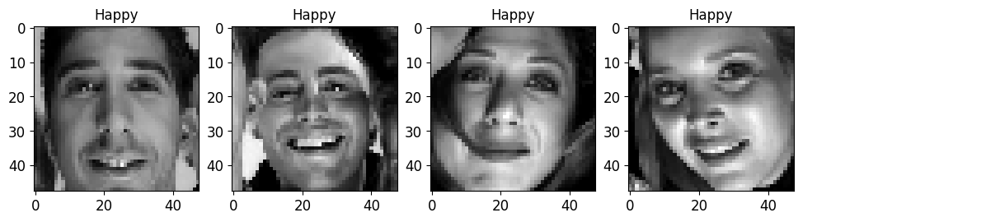

In [17]:
urllib.request.urlretrieve('https://github.com/OyuntugsGantumur/cs414.project.github.io/blob/main/test_images/test_6.png?raw=true', 
                           "test_6.png")
loaded_img = Image.open("test_6.png")

loaded_img.show()
img = np.asarray(loaded_img)

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

images = []
faces = face_cascade.detectMultiScale(gray, 
                                      scaleFactor=1.3,
                                      minNeighbors=3,
                                      minSize=(48, 48))

try:
    for i in range(0, len(faces)): 
        (x, y, w, h) = faces[i]
        face = cv2.resize(gray[y:y+w, x:x+h], (48, 48))
        images.append(face)
except:
    print("No faces detected")


#Converting the images to pixels
arr = np.zeros((len(images), 48, 48))
for n in range(len(images)):
    pixels = (255 - np.array(images[n])) / 255.
    arr[n] = [i for i in pixels]

prediction = model_1.predict(arr)
prediction = prediction.argmax(axis=-1)

n_rows = 1
n_cols = 5
plt.figure(figsize=(n_cols * 3, n_rows * 3))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index + 1)
        try:
            plt.imshow(arr[index], cmap="binary", interpolation="nearest")
            plt.title(class_names[prediction[index]], fontsize=12)
        except:
            print()

plt.axis('off')
plt.subplots_adjust(wspace=0.2, hspace=0.5)
plt.show()